# Advanced Feature Detection

This noteobok assesses the feasibility of using advanced feature detection methods that are already in use.

# Setup

In [2]:
import random
import os

import cv2

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

## Scale Invariant Feature Transform (SIFT)

Methods using the more advanced feature detection and keypoint correspondence algoirhtms availbile in OpenCV's `contrib` module were assessed, and found to be ineffective at matching images from the KL11 view.

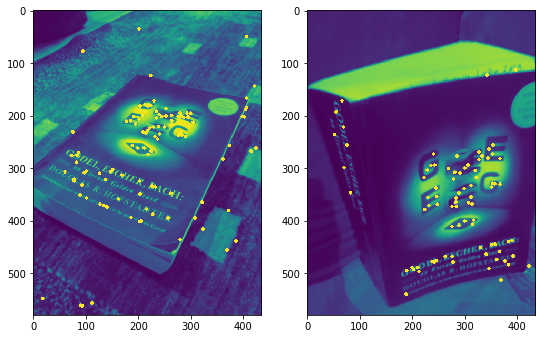

In [3]:
img_1 = cv2.pyrDown(cv2.pyrDown(cv2.pyrDown(cv2.imread('IMG_20190130_225349.jpg'))))
img_2 = cv2.pyrDown(cv2.pyrDown(cv2.pyrDown(cv2.imread('IMG_20190130_225356.jpg'))))
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

MIN_MATCH_COUNT = 10

sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img_1,None)
kp2, des2 = sift.detectAndCompute(img_2,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)

good = []
pts1 = []
pts2 = []

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        good.append(m)
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)
    
my_pts_1 = [(int(kp[0]), int(kp[1])) for kp in pts1]
my_pts_2 = [(int(kp[0]), int(kp[1])) for kp in pts2]


# plot the anchors over some image
base_copy = np.copy(img_1)

for point in my_pts_1:
    x,y = point[0], point[1]
    cv2.circle(base_copy, (x,y), 2, 255, 2)
    
# plot the anchors over some image
comp_copy = np.copy(img_2)

for point in my_pts_2:
    x,y = point[0], point[1]
    cv2.circle(comp_copy, (x,y), 2, 255, 2)
    
plt.figure(1, figsize=(9,9))
plt.subplot(121)
plt.imshow(base_copy)
plt.subplot(122)
plt.imshow(comp_copy)

[[ 3.81884386e-06 -6.86416398e-07  4.88214667e-04]
 [ 4.77672507e-06  7.16797892e-07 -1.99707896e-03]
 [-4.64542416e-03 -1.27905256e-04  1.00000000e+00]]


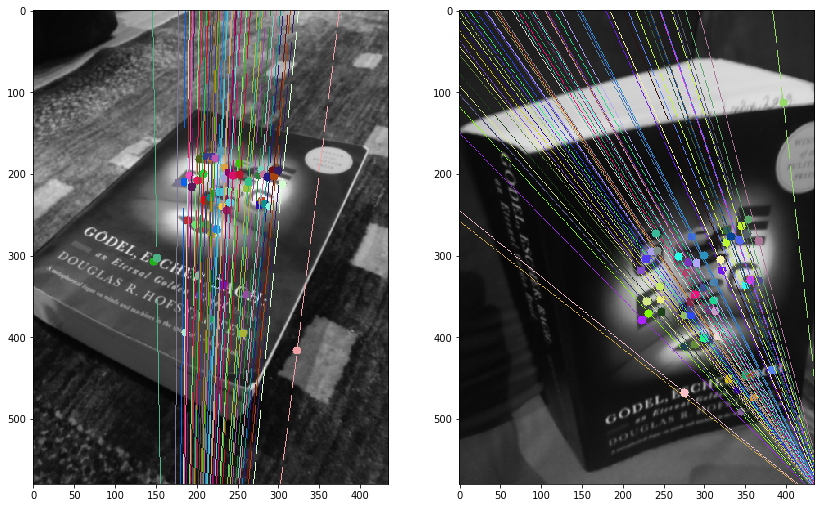

In [392]:
pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

print(F)

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(img_1,img_2,lines1,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img_2,img_1,lines2,pts2,pts1)

plt.figure(figsize=(14,14))
plt.subplot(121),plt.imshow(img5)
plt.subplot(122),plt.imshow(img3)
plt.show()

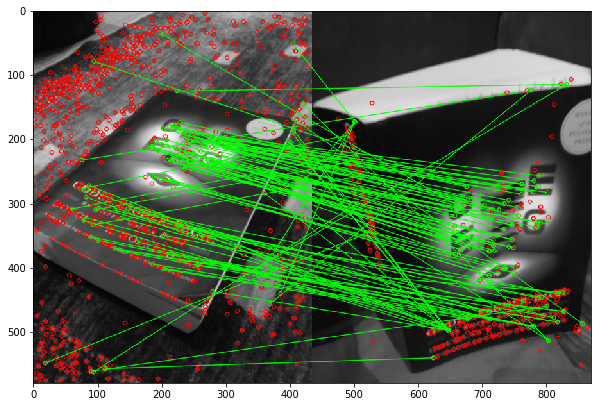

(<matplotlib.image.AxesImage at 0x139995470>, None)

In [393]:
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)
# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        matchesMask[i]=[1,0]
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv.DrawMatchesFlags_DEFAULT)
img3 = cv.drawMatchesKnn(img_1,kp1,img_2,kp2,matches,None,**draw_params)
plt.figure(figsize=(10,10))
plt.imshow(img3,),plt.show()

We can see there is some sensible degree of correspondence between two images of this book, so the technique works in practice. Now let's try images from KL11.

## KL11

In [ ]:
base = cv2.imread(f'./deepmatching_1.2.2_c++/base-pp.png', cv2.IMREAD_GRAYSCALE)
comparison = cv2.imread(f'./deepmatching_1.2.2_c++/91355-pp-2.png', cv2.IMREAD_GRAYSCALE)

MIN_MATCH_COUNT = 10


img_1 = np.copy(base)  #queryimage # left image
img_2 = np.copy(comparison) #trainimage # right image

sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img_1,None)
kp2, des2 = sift.detectAndCompute(img_2,None)



# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)

good = []
pts1 = []
pts2 = []

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.9*n.distance:
        good.append(m)
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)

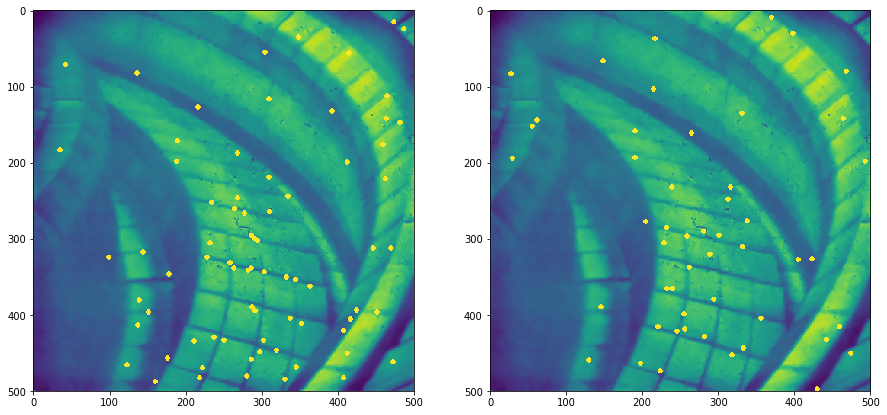

In [349]:
my_pts_1 = [(int(kp[0]), int(kp[1])) for kp in pts1]
my_pts_2 = [(int(kp[0]), int(kp[1])) for kp in pts2]


# plot the anchors over some image
base_copy = np.copy(base_ds)

for point in my_pts_1:
    x,y = point[0], point[1]
    cv2.circle(base_copy, (x,y), 2, 255, 2)
    
# plot the anchors over some image
comp_copy = np.copy(base_ds)

for point in my_pts_2:
    x,y = point[0], point[1]
    cv2.circle(comp_copy, (x,y), 2, 255, 2)
    

plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(base_copy)
plt.subplot(122)
plt.imshow(comp_copy)

In [350]:
pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

print(F)

[[-3.28824336e-05 -5.31978327e-05  7.32817328e-02]
 [ 1.15917608e-04 -2.01127348e-05 -3.15380535e-02]
 [-8.03876678e-02  3.30570427e-02  1.00000000e+00]]


In [351]:
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

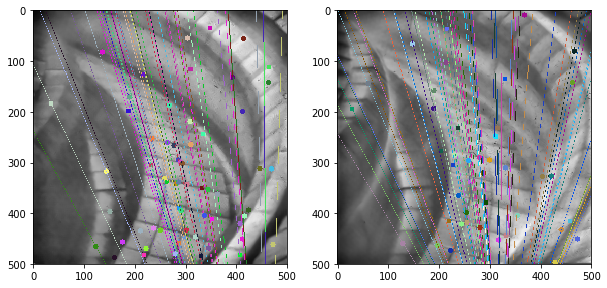

In [352]:
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(img_1,img_2,lines1,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img_2,img_1,lines2,pts2,pts1)

plt.figure(figsize=(10,10))
plt.subplot(121),plt.imshow(img5)
plt.subplot(122),plt.imshow(img3)
plt.show()

### Display Keypoints and Orientations

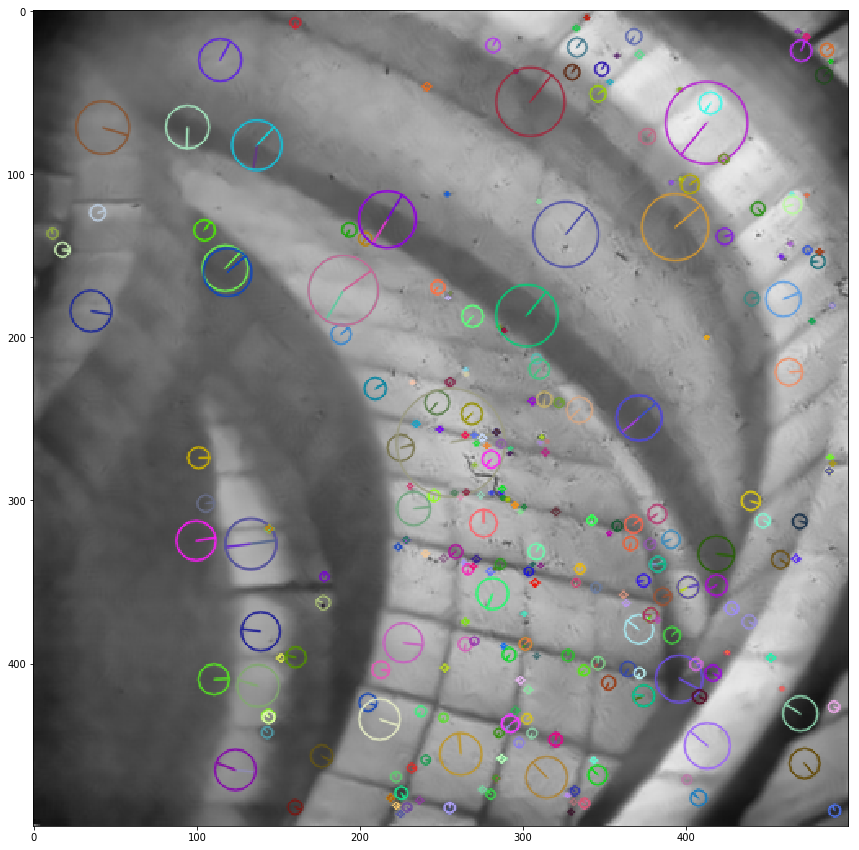

In [353]:
img_1 = np.copy(base)  #queryimage # left image
img_2 = np.copy(comparison) #trainimage # right image


sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(img_1,None)
img = np.zeros_like(img_1)

img = cv2.drawKeypoints(img_1,kp,img,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(15,15))
plt.imshow(img)

### Trying a different way

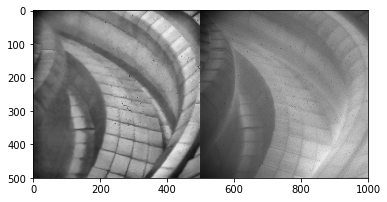

In [214]:
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)

img3 = cv2.drawMatches(img_1,kp1,img_2,kp2,good,None,**draw_params)
plt.imshow(img3)

In [354]:
sift = cv.xfeatures2d.SIFT_create()

kp1, des1 = sift.detectAndCompute(img_1,None)
sift = cv.xfeatures2d.SIFT_create()

kp2, des2 = sift.detectAndCompute(img_2,None)

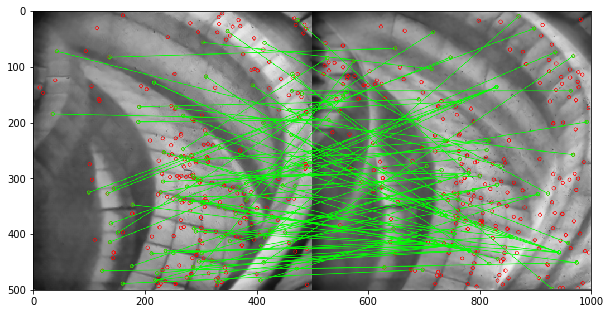

(<matplotlib.image.AxesImage at 0x13a3b69e8>, None)

In [357]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

search_params = dict(checks=50)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)
# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.9*n.distance:
        matchesMask[i]=[1,0]
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = cv.DrawMatchesFlags_DEFAULT)
img3 = cv.drawMatchesKnn(img_1,kp1,img_2,kp2,matches,None,**draw_params)
plt.figure(figsize=(10,10))
plt.imshow(img3,),plt.show()

This is no good.

# [DeepMatching](http://lear.inrialpes.fr/src/deepmatching/)

From the website:

    DeepMatching is a matching algorithm developped by Jerome Revaud in 2013. Its purpose is to compute dense correspondences between two images. DeepMatching relies on a deep, multi-layer, convolutional architecture designed for matching images. It can handle non-rigid deformations and repetitive textures, and can therefore efficiently determine dense correspondences in the presence of significant changes between images.

    We have evaluated the performance of DeepMatching, in comparison with state-of-the-art matching algorithms, on several datasets (see technical report below for details). DeepMatching outperforms the state-of-the-art algorithms in terms of accuracy and shows excellent results in particular for repetitive textures.


## Algorithm

For full details read the [paper](https://arxiv.org/abs/1506.07656) (from where all images have been lifted). As an overview, the algorithm can be viewed as two steps:

1. First, matching scores are cacluated are cacluated that quantify the similarity between a given patch in the initial image $I$ and every patch of corresponding size in the second image $I'$. This step takes a bottom-up approach, first calculating matching scores for $4 \times 4$ pixel regions, and using pooling to recursively define matching scores for larger scale patches.

2. Second, patches are matched to each other via a top-down approach, which first matches the positions entire quadrants of the image, and then recursively matches sub-quadrants until the atomic level of $4 \times 4$ patches are reached. 

### Patch Similarity

In DeepMatching, patches are defined at many levels of scale, from the 'atomic' $4\times4$ pixel patches used at the lowest level of operations, to higher patches generated from the results of computation using lower patches. In general, the similarity between two image patches $\mathbf{R}$ and $\mathbf{R}'$ is calculated by

\begin{equation}\label{sim}
    \text{sim}(\mathbf{R}, \mathbf{R}') = \frac{1}{16} \sum_{i=0}^3 \sum_{j=0}^3 \mathbf{R}^T_{ij} \mathbf{R}'_{ij} ,
\end{equation}

where each pixel $\mathbf{R}_{ij}$ is represented as the normalised sum of gradients computed from neighbouring pixels. This gradient based approach allows the algorithm to be robust to varying illuminations between images. 


### Correlation Maps

Let $I$ and $I'$ be two images we want to compare. Initially, a patch of $4 \times 4$ pixels is used at the bottom level. 
For each $4 \times 4$ patch in $I$, we compute the similarity with every other patch in $I'$ using \ref{sim}. This produces a correlation map for each $4 \times 4$ patch in $I$, as shown below.

![](https://i.imgur.com/zvR1ARH.png)

Notation: 
- $I_{N, p}$ is the $N \times N$ patch from the first image centred at $p$. 
- $\mathcal{G}_4 = \{ 2,6,10,\ldots W - 2\} \times \{2,6,10,\ldots,H-2 \}$ is the set of the centres of the atomic patches.

For the resulting steps, only these initial correlations are used - all required information has already been extracted out of $I$ and $I'$. 

### Bottom-up Correlation Pyramid

Next, correlation maps of larger patches are computed by aggregating the correlation maps of smaller patches. The aggregation works on each patch by combining it with three of its neighbours, performing max pooling, translating each patch, taking the aveage, and finially applying a retification function. These steps can be seen below.

![](https://i.imgur.com/nJEAFWn.png)


The collection of correlation maps accross iterations is referred to as the multi-level correlation pyramid. This feature of considering correspondence of larger patches by agregation of correlations of smaller patches is the mechanism by which DeepMatching considers correspondence between patches of different sizes, and is a crucial feature, allowing DeepMatching to handle repitive textures in images. This is because, ambiguities introduced by reptitive textures are resolved when moving up the correlation pyramid and considering more of the image.

### Feature Matching

Features are described by vectors $\mathbf{R} \in \mathbb{R}^{4\times 4\times 8}$ that effectively encode the content of a square image region. The approach is based on [SIFT](https://en.wikipedia.org/wiki/Scale-invariant_feature_transform) descriptors. The $4 \times 4$ part can be viewed as 4 quadrants of $2 \times 2$ cells. Once we have two descriptors $\mathbf{R}$ and $\mathbf{R}'$, DeepMatching opimises the positions $p_i \in \mathbb{R}^2$ of the quadrants of the target descriptor $\mathbf{R}'$, rather than keeping them fixed. This is demonstrated below

![](https://i.imgur.com/5M2cq8c.png)

In the left and right images, we can see that the centre of each quadrant moves to stay aligned with the feautres inside it, even though these features may be moving independently to one another. This allows the algorithm to handle non-rigid motion of the scene. The left and middle images display the situation without the optimial moving quadrant SIFT matching.

This optimal moving quadrant matching is performed by finding the $p_i$ (centre position of quadrant) that maximises the similarity between the two patches $\mathbf{R}$ and $\mathbf{R}'$.

\begin{equation}
     \text{sim}(\mathbf{R}, \mathbf{R}') = \text{max}_{p_i} \frac{1}{4} \sum_{i=0}^3  ~\text{sim} (\mathbf{R}_i, \mathbf{R}'_i (p_i))   ,
\end{equation}

This approach is applied recursively to each quadrant by subdiving it into 4 sub-quadrants until the minimum $4 \times 4$ pixel patch size is reached. In this way, finding atomic patch correspondence is done in a top down-fashion, in contrast to the bottom-up approach utilised in the computation of the matching scores.


![](https://i.imgur.com/WYXvOEP.png)

Backtracking atomic correspondences from an entry point (red dot) in the top pyramid level (left). At each level, the backtracking consists in undoing the aggregation performed previously in order to recover the position of the four children patches in
the lower level. When the bottom level is reached, we obtain a set of correspondences for atomic patches (right)


### Customisation

The DeepMatching algorithm allows for 26$^\circ$ of angluar rotations, and scaling from 0.5x to 1.5x. Clearly this is much more tolerance than we need, and we would presumably be able to remove many erroneous points by changing these limits to something more reasonable for our purposes. It appears that these options can actually be set through the CLI.


### DeepFlow

The authors additionally created a package called DeepFlow, which performs dense optical flow between a pair of images, using as input the point pairs generated by DeepMatching. DeepFlow ouputs a `.flo` file which specifies the motion field for the image. So DeepFlow is essentially a more general replacement replacement for image homographies. 

## Testing the Stock Image

In [2]:
# load the stock images (DeepMatching has been performed already)
climb1 = cv2.imread('deepmatching_1.2.2_c++/climb1.png')
climb2 = cv2.imread('deepmatching_1.2.2_c++/climb2.png')

# read the results of deepmatching
df = pd.read_csv('deepmatching_1.2.2_c++/tests/climb-deepmatch.csv', delimiter=' ', header=None, 
                 names=['x_1', 'y_1', 'x_2', 'y_2', 'unknown_1', 'unknown_2'])

print('unknown_1 range:', df['unknown_1'].min(), ' - ', df['unknown_1'].max())
print('unknown_2 range:', df['unknown_2'].min(), ' - ', df['unknown_2'].max())

df.head()

unknown_1 range: 3.8695  -  5.07134
unknown_2 range: 1  -  38700


,x_1,y_1,x_2,y_2,unknown_1,unknown_2
0,516,260,584,6,4.24988,14560
1,516,268,470,60,4.26607,2337
2,516,404,524,222,4.27840,1980
3,516,412,524,230,4.24726,1980
4,516,428,516,254,4.22302,1041


Rows 0,1,2,3 are the coordinates of the point pair. Rows 4 and 5 are a mystery but define some scoring metrics. We take a random sample of point pairs and plot the correspondence on the stock image.

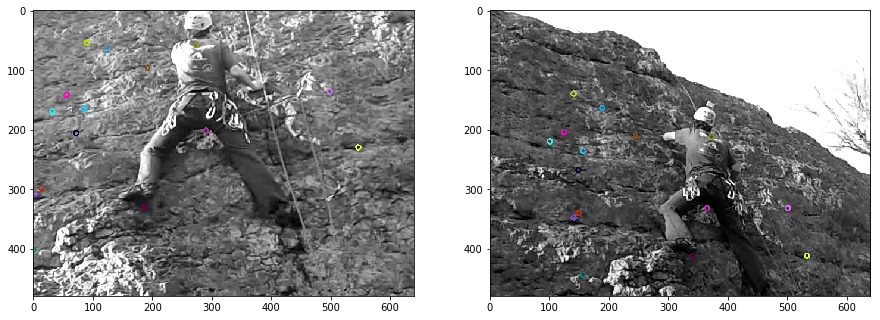

In [3]:
sampled = df.sample(frac=0.01)
before = sampled[['x_1','y_1']].values
after = sampled[['x_2','y_2']].values
unknown1 = sampled['unknown_1'].values
unknown2 = sampled['unknown_2'].values
colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]

# plot the anchors over some image
climb1_copy = np.copy(climb1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(climb1_copy, (x,y), 4, c, 2)
    
# plot the anchors over some image
climb2_copy = np.copy(climb2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(climb2_copy, (x,y), 4, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(climb1_copy)
plt.subplot(122)
plt.imshow(climb2_copy)

In order to try and determine what the two unknown columns are, we will plot the max and min point pairs for each column, and see how good the correspondences are.

Text(0.5, 0.65, 'Minimal unknown_1 points')

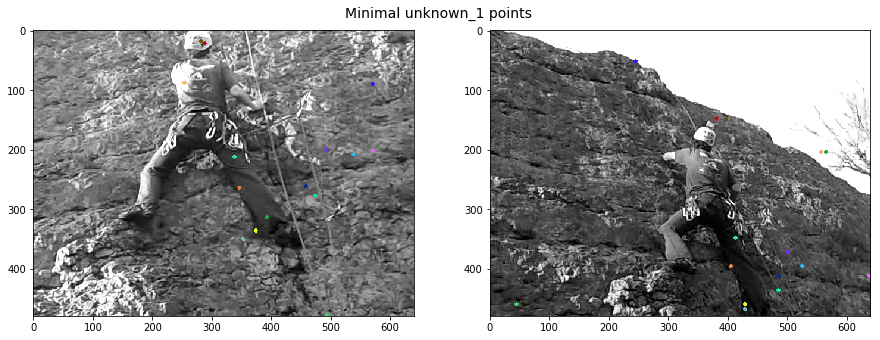

In [4]:
min_u1 = df.sort_values('unknown_1').head(20)

before = min_u1[['x_1','y_1']].values
after = min_u1[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]

# plot the anchors over some image
climb1_copy = np.copy(climb1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(climb1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
climb2_copy = np.copy(climb2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(climb2_copy, (x,y), 2, c, 2)
    
fig = plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(climb1_copy)
plt.subplot(122)
plt.imshow(climb2_copy)
fig.text(0.5, 0.65, 'Minimal unknown_1 points', ha='center', va='center', fontsize=14)


Some of these points are wildly wrong, looks like low unknown_1 = bad match.

Text(0.5, 0.65, 'Maximising unknown column 1')

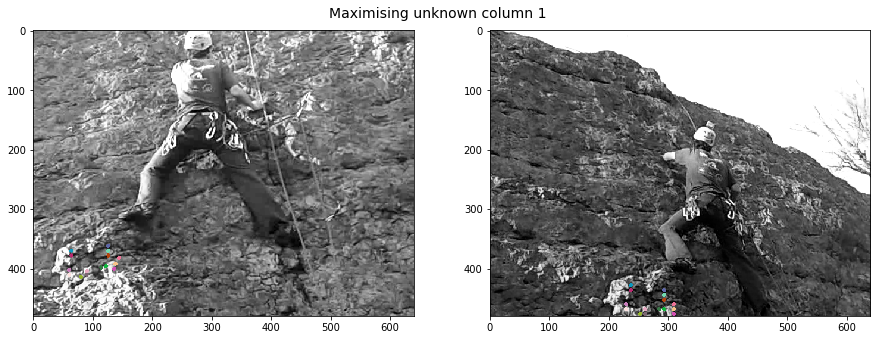

In [5]:
max_u1 = df.sort_values('unknown_1').tail(20)

before = max_u1[['x_1','y_1']].values
after = max_u1[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]

# plot the anchors over some image
climb1_copy = np.copy(climb1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(climb1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
climb2_copy = np.copy(climb2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(climb2_copy, (x,y), 2, c, 2)
    
fig = plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(climb1_copy)
plt.subplot(122)
plt.imshow(climb2_copy)
fig.text(0.5, 0.65, 'Maximising unknown column 1', ha='center', va='center', fontsize=14)


These points are all sensible, although it is not clear why they should be so localised. The localisation means it would not be a good idea to just take the max of points in this column, though prehaps we could remove the tail to ignoew some dodgey point pairs that have low unknown_1.

Now, looking at unknown_2.

Text(0.5, 0.65, 'Minimising unknown column 2')

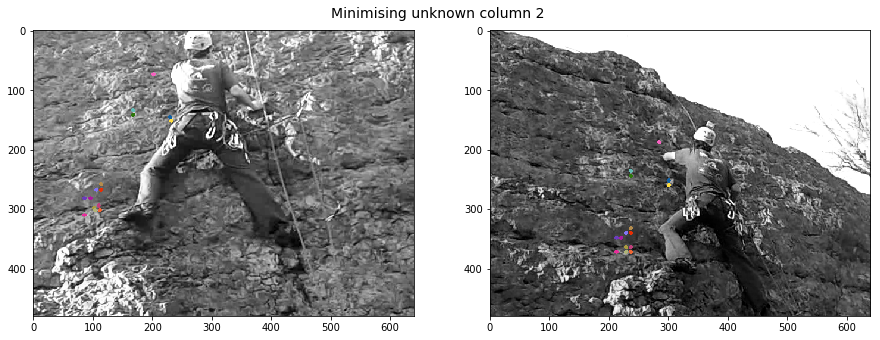

In [6]:
min_u2 = df.sort_values('unknown_2').head(20)

before = min_u2[['x_1','y_1']].values
after = min_u2[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]

# plot the anchors over some image
climb1_copy = np.copy(climb1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(climb1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
climb2_copy = np.copy(climb2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(climb2_copy, (x,y), 2, c, 2)
    
fig = plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(climb1_copy)
plt.subplot(122)
plt.imshow(climb2_copy)
fig.text(0.5, 0.65, 'Minimising unknown column 2', ha='center', va='center', fontsize=14)


These points all look sensible.

Text(0.5, 0.65, 'Maximising unknown column 2')

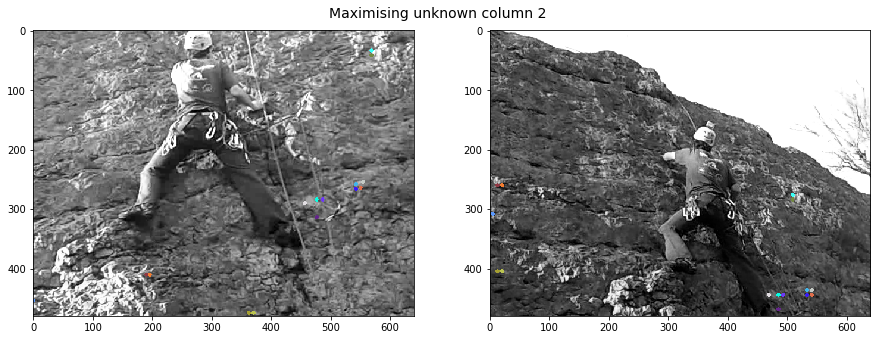

In [7]:
max_u2 = df.sort_values('unknown_2').tail(20)

before = max_u2[['x_1','y_1']].values
after = max_u2[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]

# plot the anchors over some image
climb1_copy = np.copy(climb1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(climb1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
climb2_copy = np.copy(climb2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(climb2_copy, (x,y), 2, c, 2)
    
fig = plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(climb1_copy)
plt.subplot(122)
plt.imshow(climb2_copy)
fig.text(0.5, 0.65, 'Maximising unknown column 2', ha='center', va='center', fontsize=14)


This is inconclusive: some poin paris look good, some are wildly off... We will probably have to dig into the code to work out exactly what is going on here.

EDIT: I've found a reference to these values:

```pair-wise point correspondences: x1 y1 x2 y2 score index ... (index refers to the local maximum from which the match was retrieved)```

## KL11

Now let's test DeepMatching on some images we are actually interested in. Unless specified, images have been preprocessed by hand.

Let's look at the first exmaple in some detail. Here are the two preprocessed images.

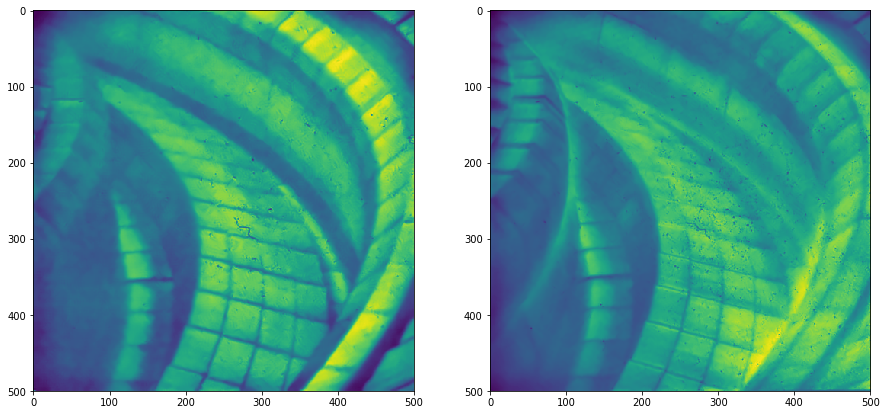

In [5]:
img_1 = cv2.imread(f'./deepmatching/tests/base-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread(f'./deepmatching/tests/91355-pp.png', cv2.IMREAD_GRAYSCALE)

plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1)
plt.subplot(122)
plt.imshow(img_2)
plt.show()

In [7]:
df = pd.read_csv('deepmatching/tests/kl11-deepmatch.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])
print(df.shape)
df.head()

(1028, 6)


,x_1,y_1,x_2,y_2,score,index
0,132,140,160,158,4.89930,2191
1,132,148,162,170,5.00951,1542
2,132,156,158,182,4.97676,1542
3,132,4,132,4,4.91329,3760
4,132,268,136,254,4.99062,428


In [8]:
df['x_diff'] = df['x_1'] - df['x_2']
df['y_diff'] = df['y_1'] - df['y_2']

df[(df['x_diff'] != 0) ^ (df['y_diff'] != 0)].mean()
df_filtered = df[(df['x_diff'] != 0) ^ (df['y_diff'] != 0)]
df_filtered = df_filtered[df_filtered['score'] > df_filtered['index'].max()*0.9]
df_filtered.shape

(0, 8)

### Visualising Point Pairs

Plot point pairs for both images coloured by their score. We see the top scores occur in the bottom left corner.

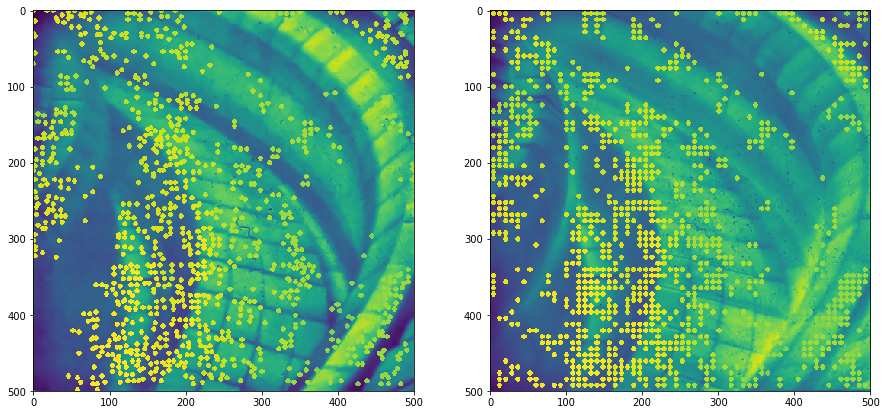

In [9]:
sampled = df.sample(frac=1)

before = sampled[['x_1','y_1']].values
after = sampled[['x_2','y_2']].values
cs = sampled['score'].values
cs = cs / cs.max() * 255

colors = [(c, c, c) for c in cs]

# plot the anchors over some image
img_1_copy = np.copy(img_1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(img_1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
img_2_copy = np.copy(img_2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(img_2_copy, (x,y), 2, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1_copy)
plt.subplot(122)
plt.imshow(img_2_copy)

What is still less clear at this stage is what the `index` value represents. Interestingly, the index appears to be anticorrelated with the score.

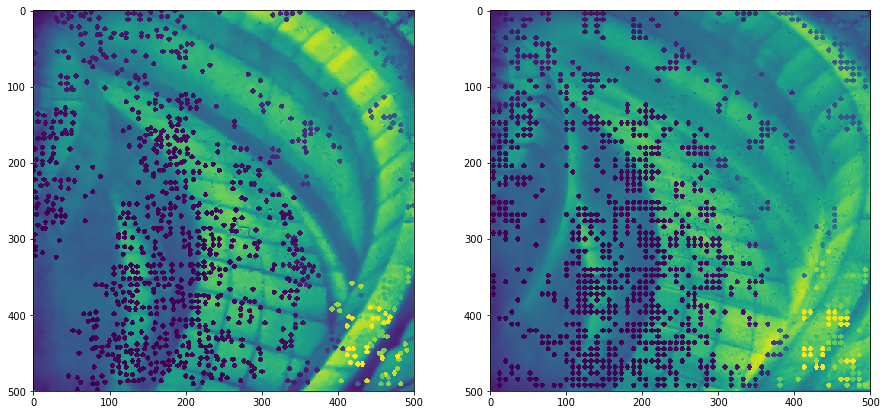

In [15]:
sampled = df.sample(frac=1)

before = sampled[['x_1','y_1']].values
after = sampled[['x_2','y_2']].values
cs = sampled['unknown_2'].values
cs = cs / cs.max() * 255

#colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(sampled))]
colors = [(c, c, c) for c in cs]

# plot the anchors over some image
img_1_copy = np.copy(img_1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(img_1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
img_2_copy = np.copy(img_2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(img_2_copy, (x,y), 2, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1_copy)
plt.subplot(122)
plt.imshow(img_2_copy)

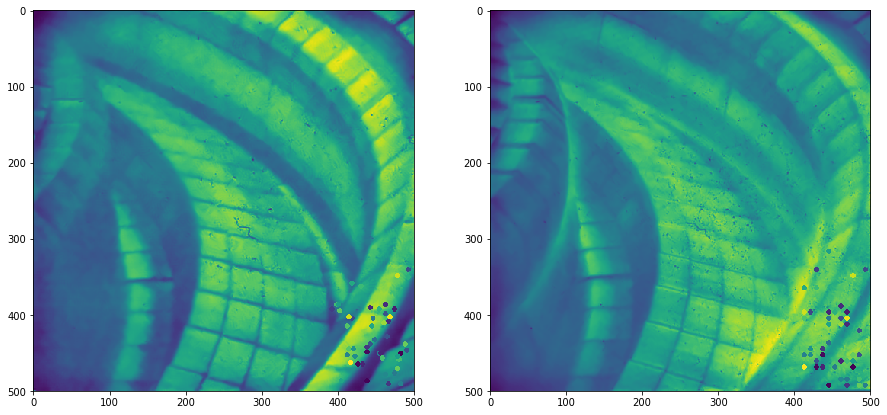

In [16]:
mins = df.sort_values('unknown_2').tail(50)

before = mins[['x_1','y_1']].values
after = mins[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(mins))]

# plot the anchors over some image
img_1_copy = np.copy(img_1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(img_1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
img_2_copy = np.copy(img_2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(img_2_copy, (x,y), 2, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1_copy)
plt.subplot(122)
plt.imshow(img_2_copy)

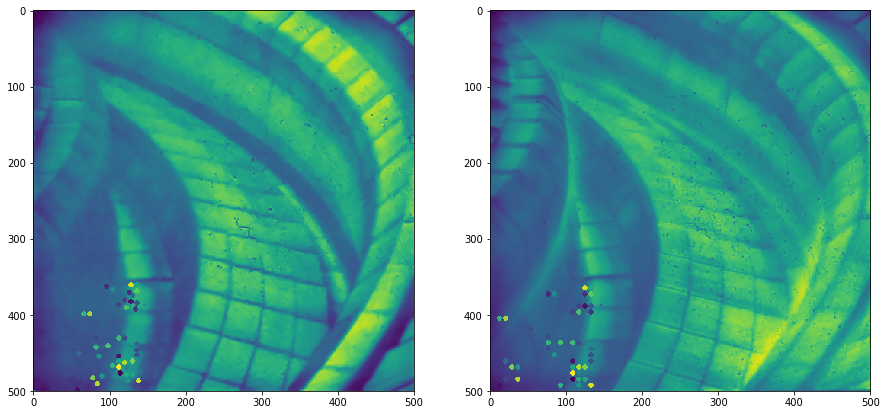

In [17]:
mins = df.sort_values('unknown_2').head(50)

before = mins[['x_1','y_1']].values
after = mins[['x_2','y_2']].values

colors = [(random.randint(0,255),random.randint(0,255),random.randint(0,255)) for i in range(len(mins))]

# plot the anchors over some image
img_1_copy = np.copy(img_1)

for point,c in zip(after, colors):
    x,y = point[0], point[1]
    cv2.circle(img_1_copy, (x,y), 2, c, 2)
    
# plot the anchors over some image
img_2_copy = np.copy(img_2)

for point,c in zip(before, colors):
    x,y = point[0], point[1]
    cv2.circle(img_2_copy, (x,y), 2, c, 2)
    
plt.figure(1, figsize=(15,15))
plt.subplot(121)
plt.imshow(img_1_copy)
plt.subplot(122)
plt.imshow(img_2_copy)

### Homography

Finding a homography. Note the use of the `method` keyword in `cv2.findHomography`. The non-standard methods such as `RANSAC` and `LMEDS` are robust methods of finding homographies given noisy point pairs. They do something like repeating sampling from all the point pairs, and fit the best homograpy while ignoring outliers.

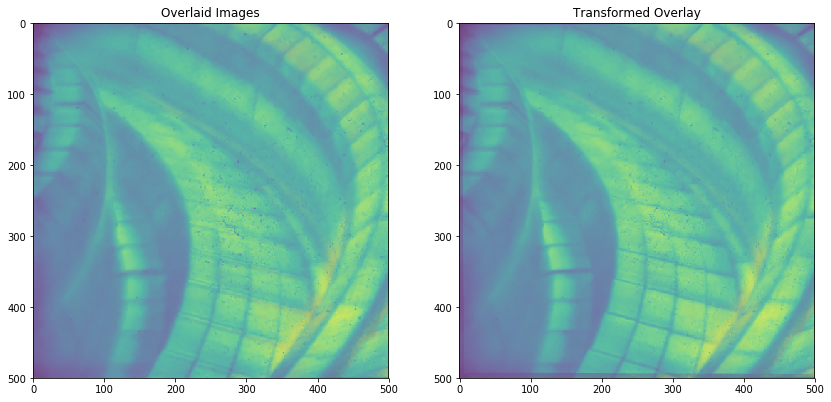

In [25]:
before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.RANSAC)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(14,14))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(img_1, alpha=0.5)
plt.imshow(img_2, alpha=0.5)

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(base_transformed_img, alpha=0.5)
plt.imshow(img_2, alpha=0.5)

plt.show()

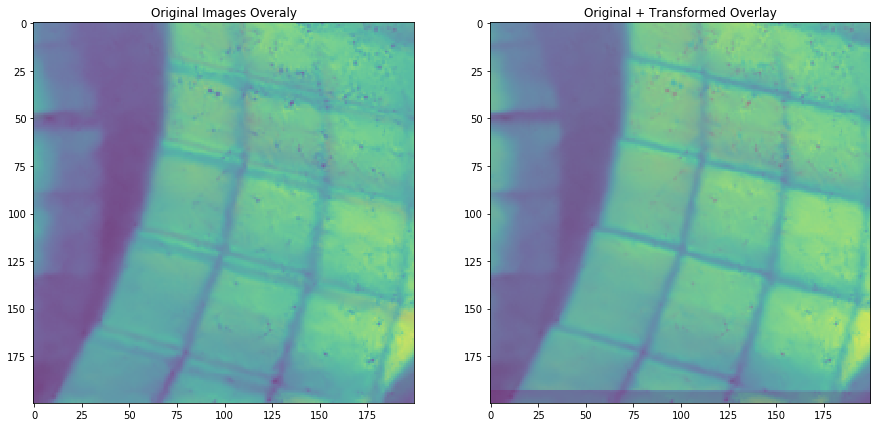

In [26]:
plt.figure(1, figsize=(15,15))

plt.subplot(121)
plt.title('Original Images Overaly')
plt.imshow(img_1[300:500,150:350], alpha=0.5)
plt.imshow(img_2[300:500,150:350], alpha=0.5)

plt.subplot(122)
plt.title('Original + Transformed Overlay')
plt.imshow(base_transformed_img[300:500,150:350], alpha=0.5)
plt.imshow(img_2[300:500,150:350], alpha=0.5)

plt.show()

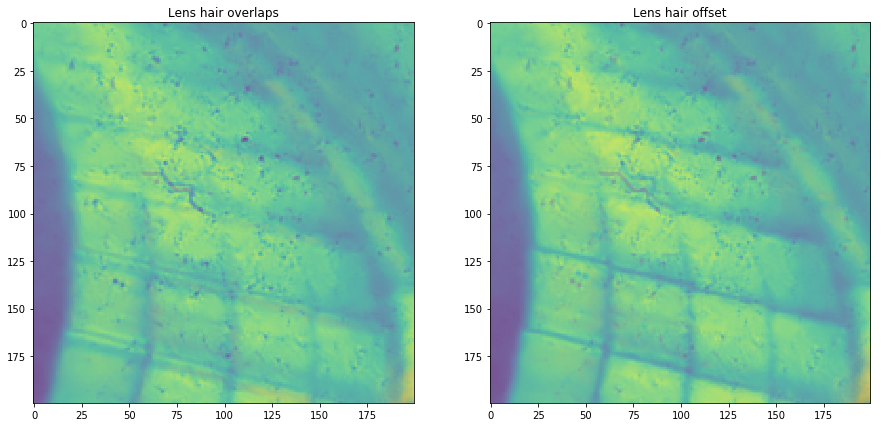

In [27]:
plt.figure(1, figsize=(15,15))

plt.subplot(121)
plt.title('Lens hair overlaps')
plt.imshow(img_1[200:400,200:400], alpha=0.5)
plt.imshow(img_2[200:400,200:400], alpha=0.5)

plt.subplot(122)
plt.title('Lens hair offset')
plt.imshow(base_transformed_img[200:400,200:400], alpha=0.5)
plt.imshow(img_2[200:400,200:400], alpha=0.5)

plt.show()

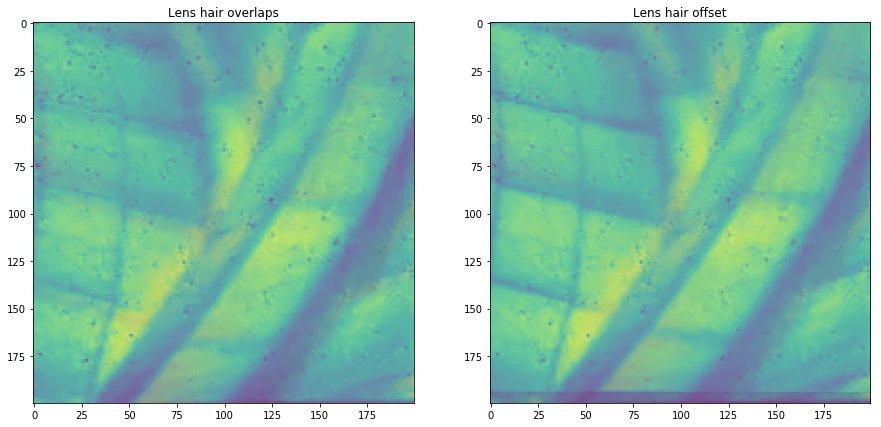

In [25]:
plt.figure(1, figsize=(15,15))

plt.subplot(121)
plt.title('Lens hair overlaps')
plt.imshow(img_1[300:500,300:500], alpha=0.5)
plt.imshow(img_2[300:500,300:500], alpha=0.5)

plt.subplot(122)
plt.title('Lens hair offset')
plt.imshow(base_transformed_img[300:500,300:500], alpha=0.5)
plt.imshow(img_2[300:500,300:500], alpha=0.5)

plt.show()

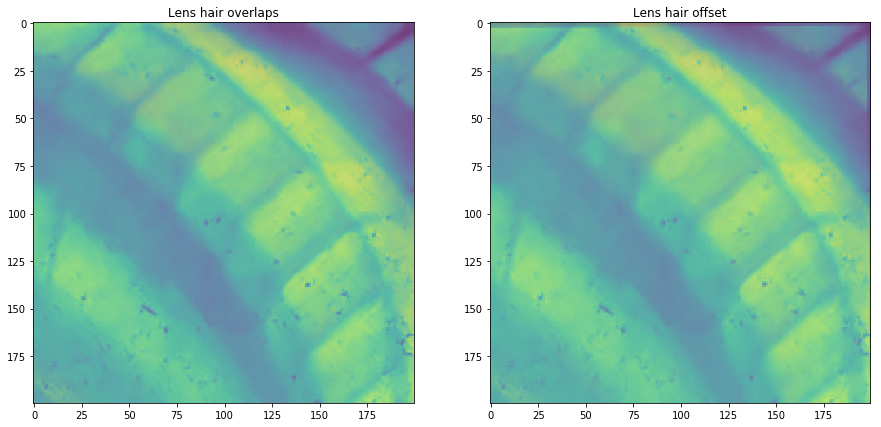

In [26]:
plt.figure(1, figsize=(15,15))

plt.subplot(121)
plt.title('Lens hair overlaps')
plt.imshow(img_1[0:200,300:500], alpha=0.5)
plt.imshow(img_2[0:200,300:500], alpha=0.5)

plt.subplot(122)
plt.title('Lens hair offset')
plt.imshow(base_transformed_img[0:200,300:500], alpha=0.5)
plt.imshow(img_2[0:200,300:500], alpha=0.5)

plt.show()

The results are very promising!

### Visualising with RG

After experimenting with some different ways of visualising results, using colour information to overla the images in different colours was found to be the best way of visualising the results of the homography. (at least until we get the wireframe overlays up and running)

In [28]:
def overlay(img_1, img_2):
    
    if len(img_1.shape) == 3:
        overlay = np.zeros_like(img_1, dtype='uint8')
    else:
        overlay = np.zeros((img_1.shape[0], img_1.shape[0], 3), dtype='uint8')

    overlay[:,:,0] = img_1
    overlay[:,:,1] = img_2
    
    return overlay

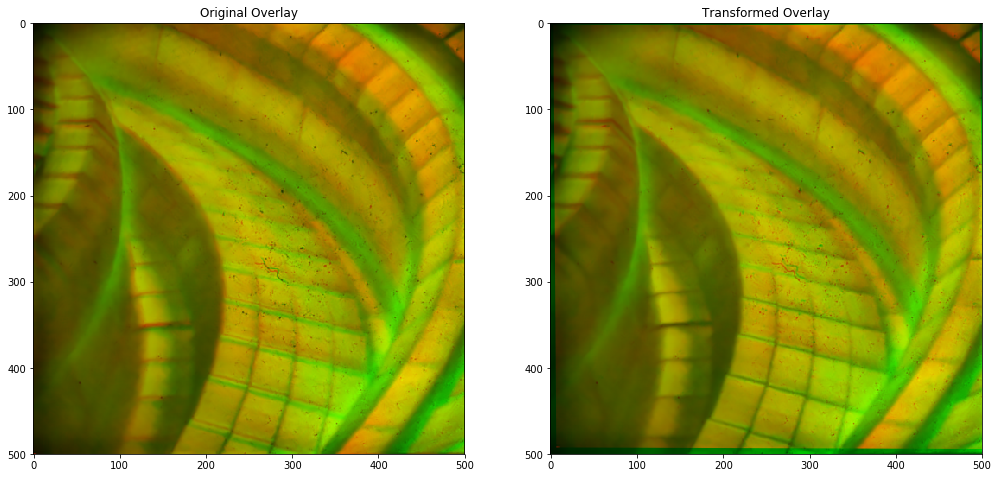

In [38]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2))

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

plt.show()

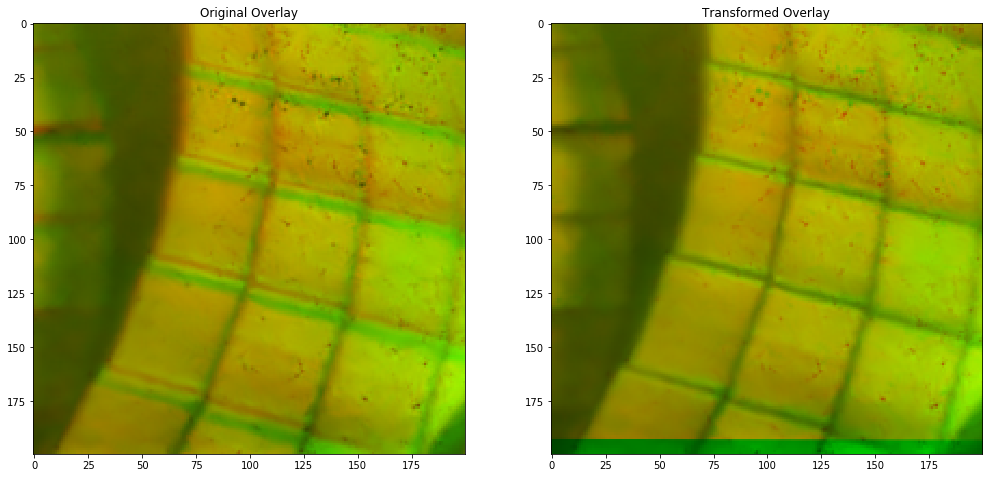

In [39]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,150:350])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,150:350])

plt.show()

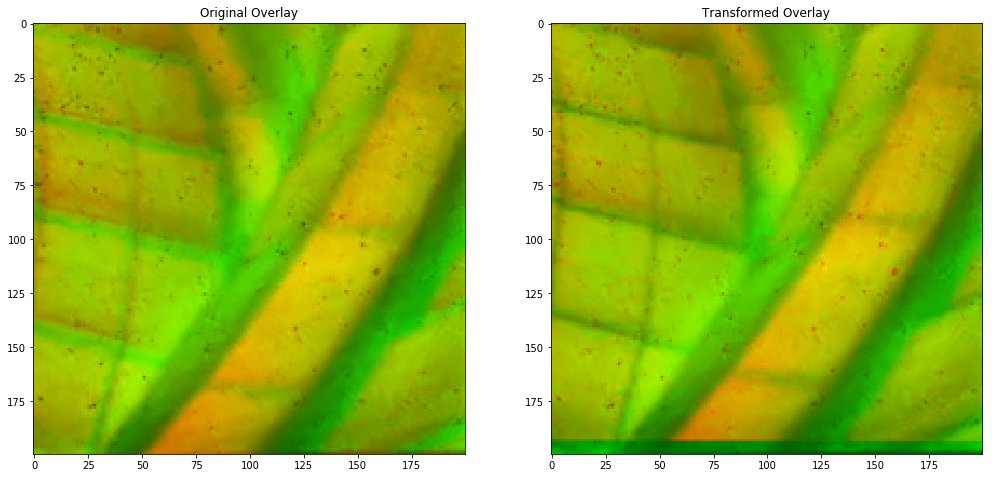

In [40]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,300:500])

plt.show()

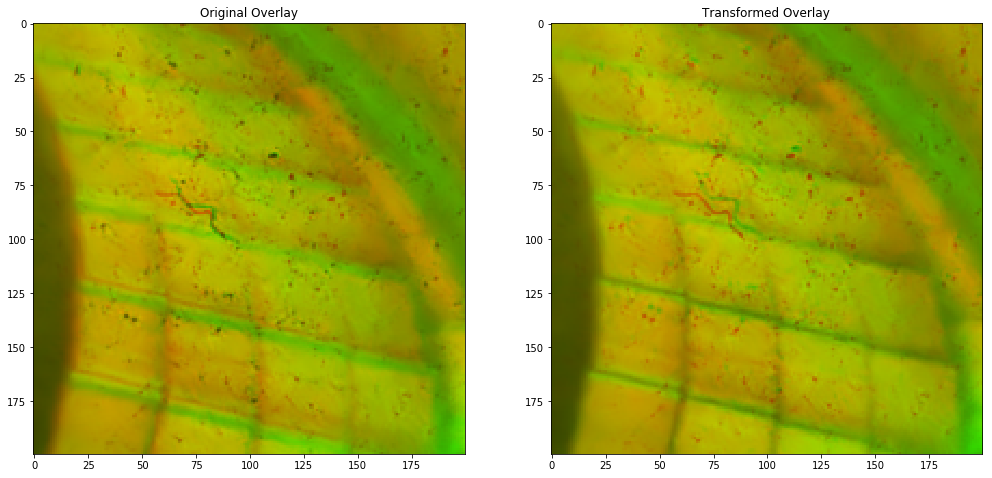

In [42]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[200:400,200:400])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[200:400,200:400])

plt.show()

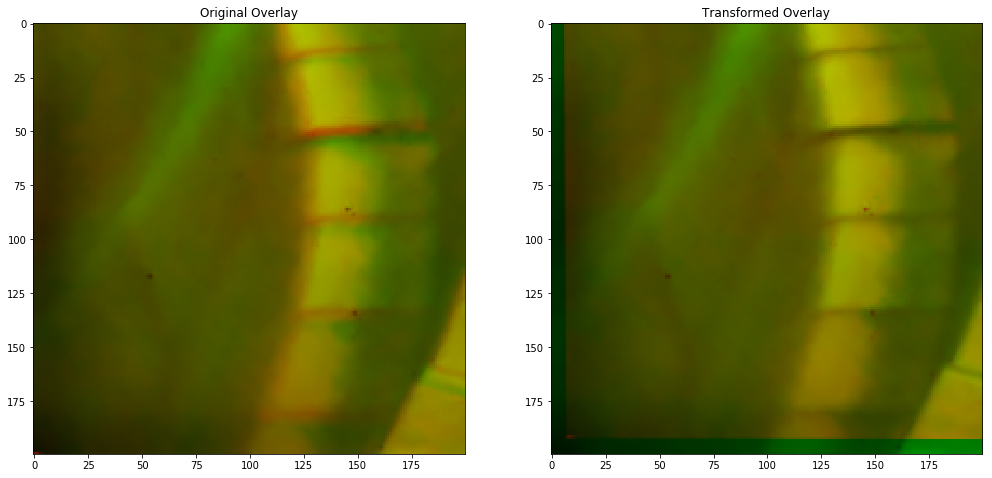

In [44]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,0:200])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,0:200])

plt.show()

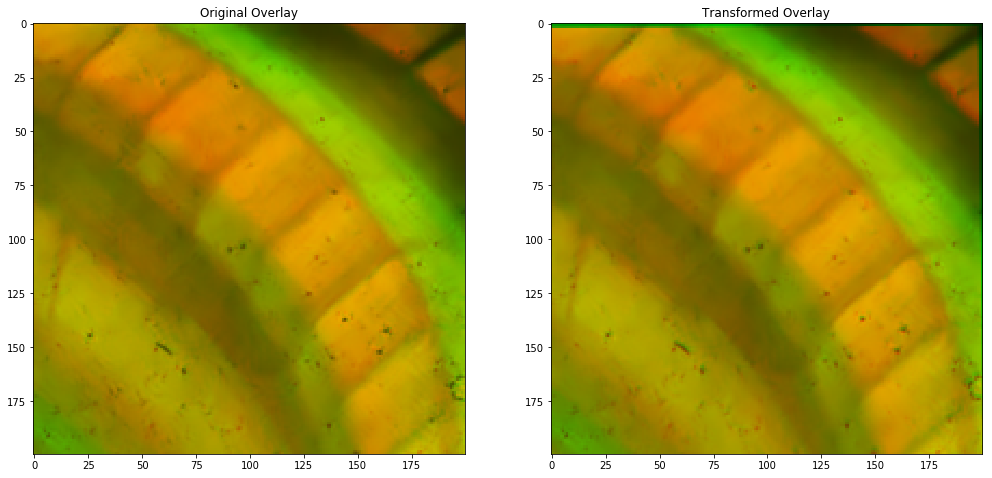

In [45]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[0:200,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[0:200,300:500])

plt.show()

## More examples

Since the above result is so encoraging, we have to make more tests to be sure of the performance.

### Image -> 89425

In [105]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/image-pp.png', cv2.IMREAD_GRAYSCALE)
img_3 = cv2.imread('data/real/KL11-E1DC/manual-pp/89425-pp.png', cv2.IMREAD_GRAYSCALE)

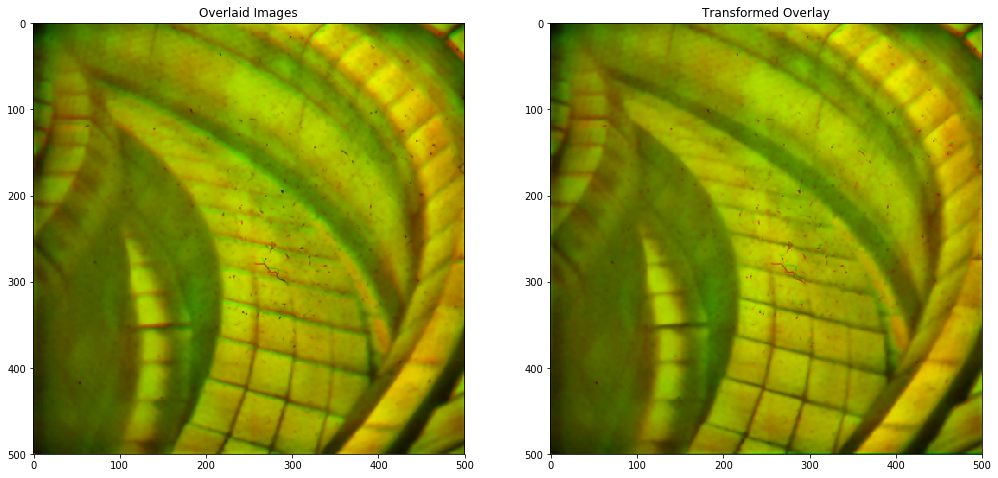

In [116]:
df = pd.read_csv('deepmatching/tests/89425.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.RANSAC)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_3))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_3))

plt.show()

Again, this works out of the box. However, notice how the top right corner is not well aligned. Tried another homography method and it works much better!

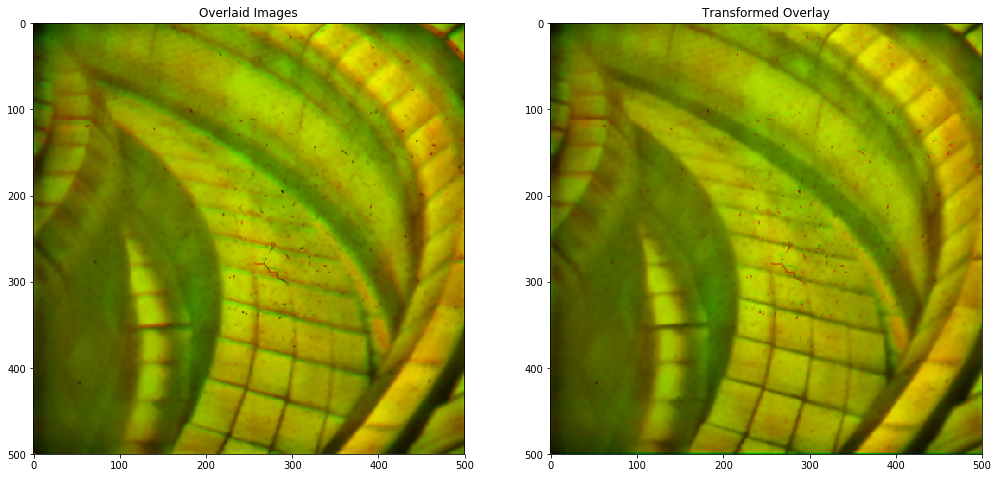

In [118]:
df = pd.read_csv('deepmatching/tests/89425.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.LMEDS)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_3))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_3))

plt.show()

### 91355 -> 89425

In [121]:
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91355-pp.png', cv2.IMREAD_GRAYSCALE)
img_3 = cv2.imread('data/real/KL11-E1DC/manual-pp/89425-pp.png', cv2.IMREAD_GRAYSCALE)

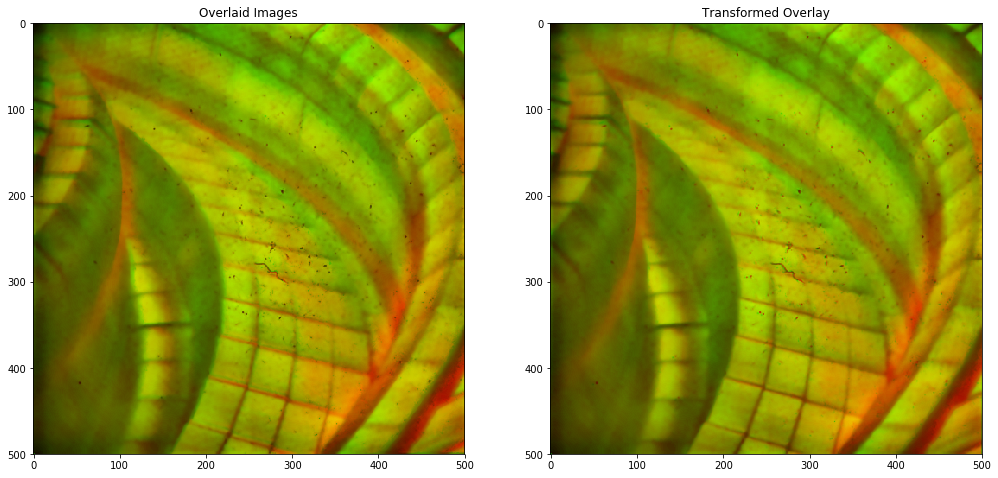

In [123]:
df = pd.read_csv('deepmatching/tests/91355-89425.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.LMEDS)
base_transformed_img = cv2.warpPerspective(img_2, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_2, img_3))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_3))

plt.show()

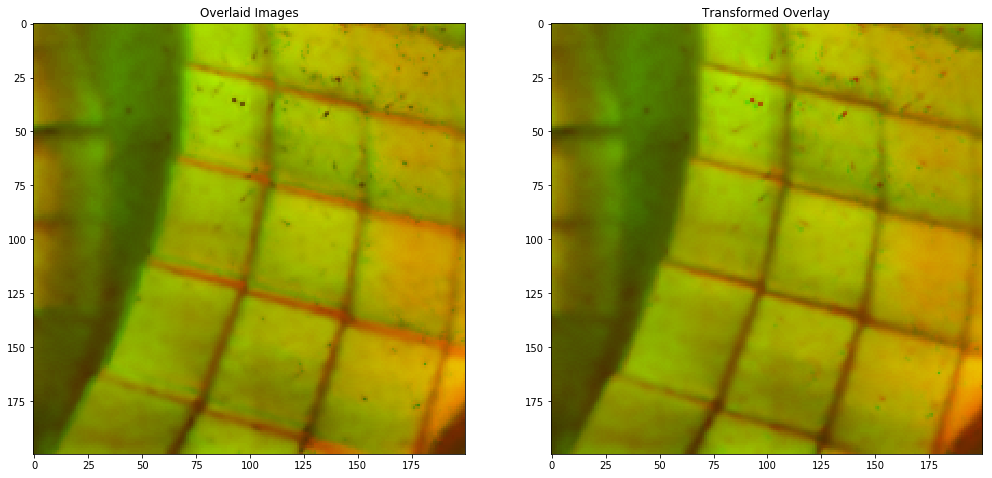

In [126]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_2, img_3)[300:500, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_3)[300:500, 150:350])

plt.show()

### Image -> 91993

In [139]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/image-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91993-pp.png', cv2.IMREAD_GRAYSCALE)

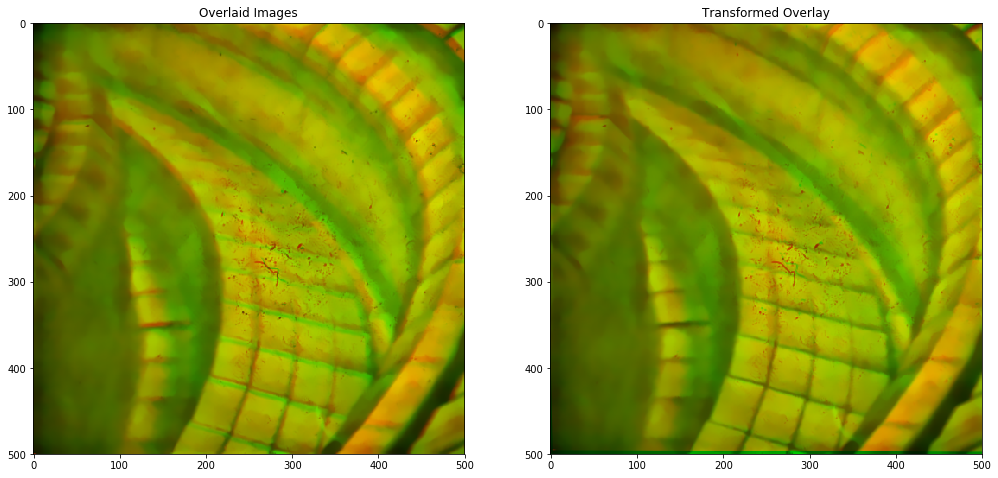

In [140]:
df = pd.read_csv('deepmatching/tests/91993.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.LMEDS)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

more_agg_pp = overlay(base_transformed_img, img_2)

plt.show()

Looking at the two original images reminds up how impressive this is.

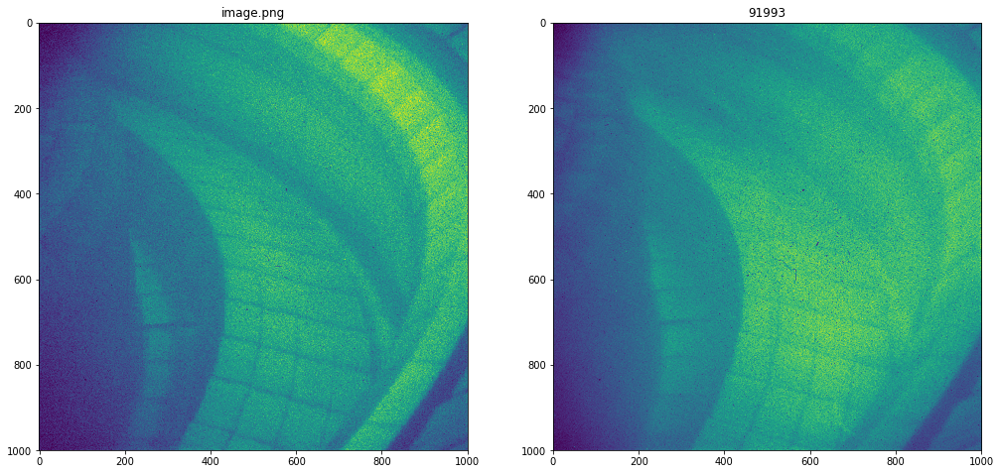

In [136]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/image.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/91993.png', cv2.IMREAD_GRAYSCALE)

plt.figure(1, figsize=(17,17))
plt.subplot(121)
plt.title('image.png')
plt.imshow(img_1)
plt.subplot(122)
plt.title('91993')
plt.imshow(img_2)

Trying again with less agressive preprocessing: (note still using the same image for visualisation but different point pairs file)

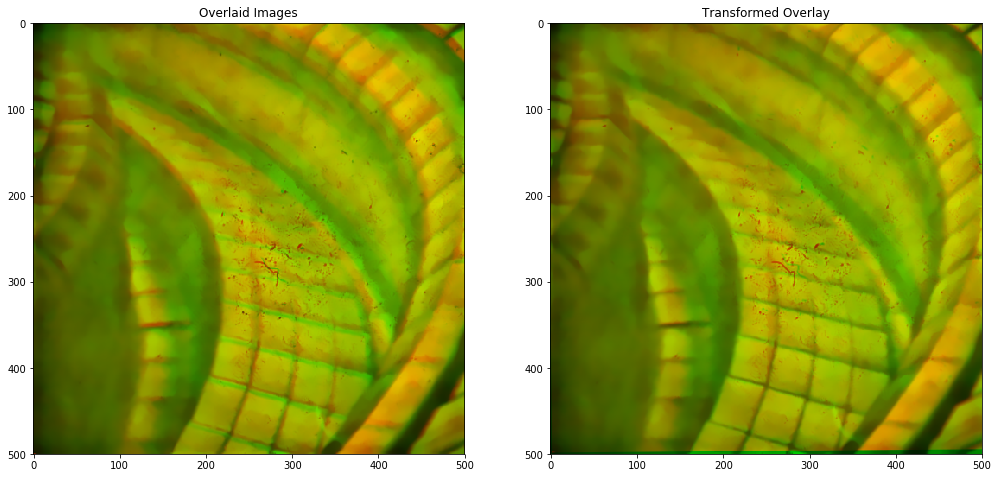

In [146]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/image-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91993-pp.png', cv2.IMREAD_GRAYSCALE)

df = pd.read_csv('deepmatching/tests/91993-2.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.LMEDS)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

less_agg_pp = overlay(base_transformed_img, img_2)

plt.show()

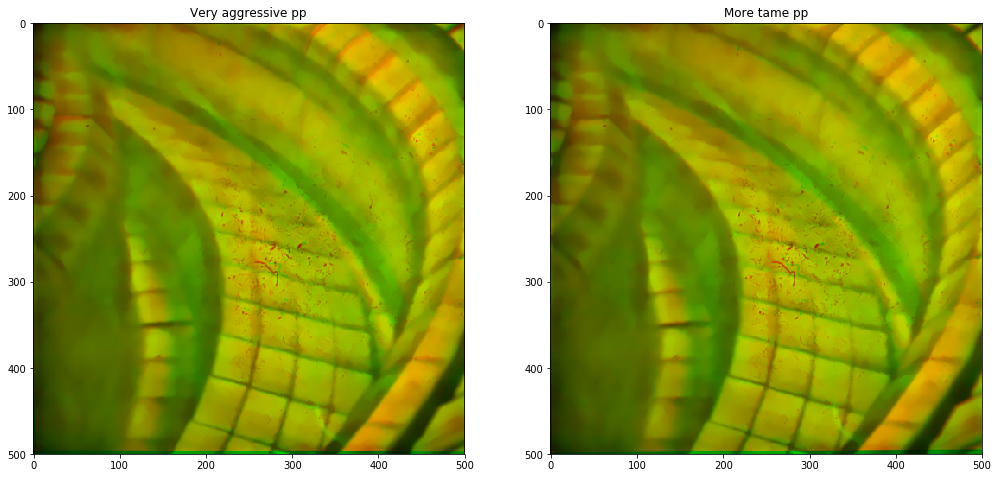

In [147]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Very aggressive pp')
plt.imshow(more_agg_pp)

plt.subplot(122)
plt.title('More tame pp')
plt.imshow(less_agg_pp)

plt.show()

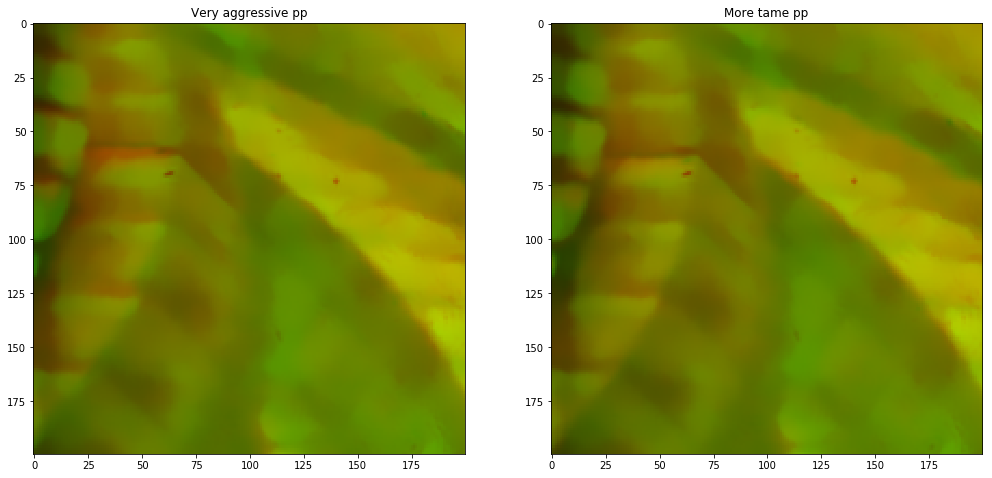

In [148]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Very aggressive pp')
plt.imshow(more_agg_pp[50:250, 0:200])

plt.subplot(122)
plt.title('More tame pp')
plt.imshow(less_agg_pp[50:250, 0:200])

plt.show()

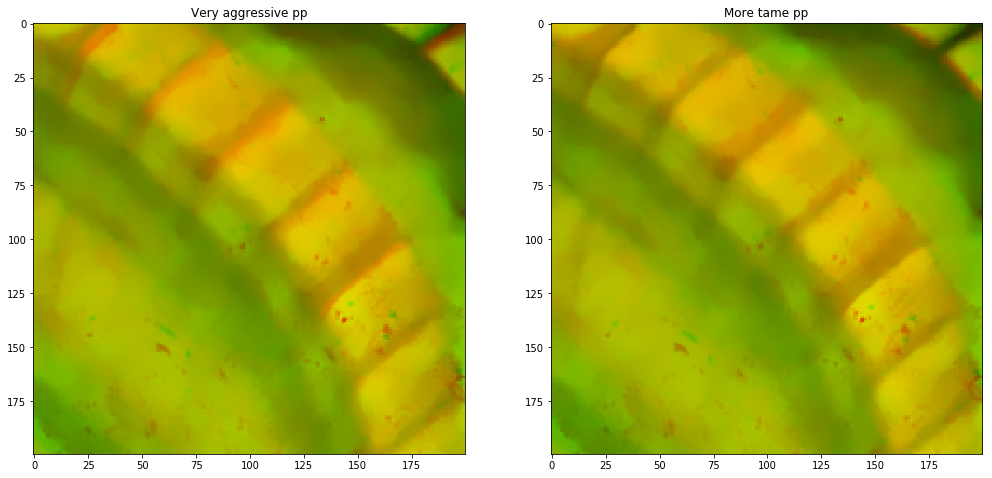

In [150]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Very aggressive pp')
plt.imshow(more_agg_pp[0:200, 300:500])

plt.subplot(122)
plt.title('More tame pp')
plt.imshow(less_agg_pp[0:200, 300:500])

plt.show()

Looks like I did in fact go a little overboard with the pp

## Plasma

We want to be able to do this for images with plasma in them, is that possible?

### 1

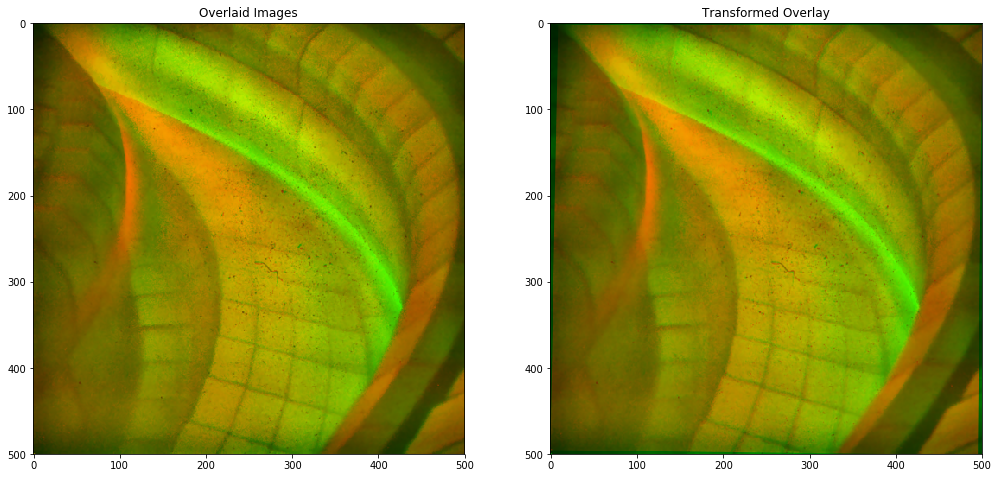

In [29]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/92189-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91651-pp.png', cv2.IMREAD_GRAYSCALE)

df = pd.read_csv('deepmatching/tests/92189-pp--91651-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.LMEDS)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

plt.show()

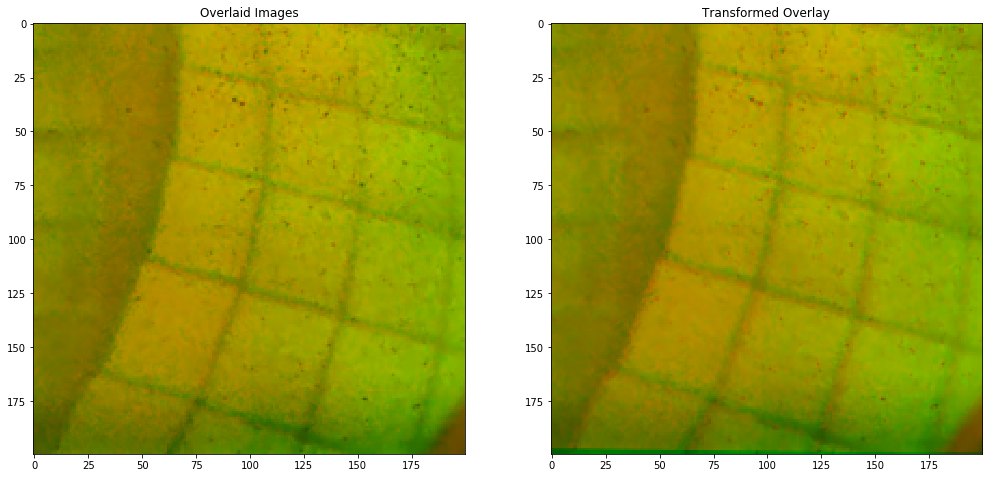

In [31]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2)[300:500, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500, 150:350])

plt.show()

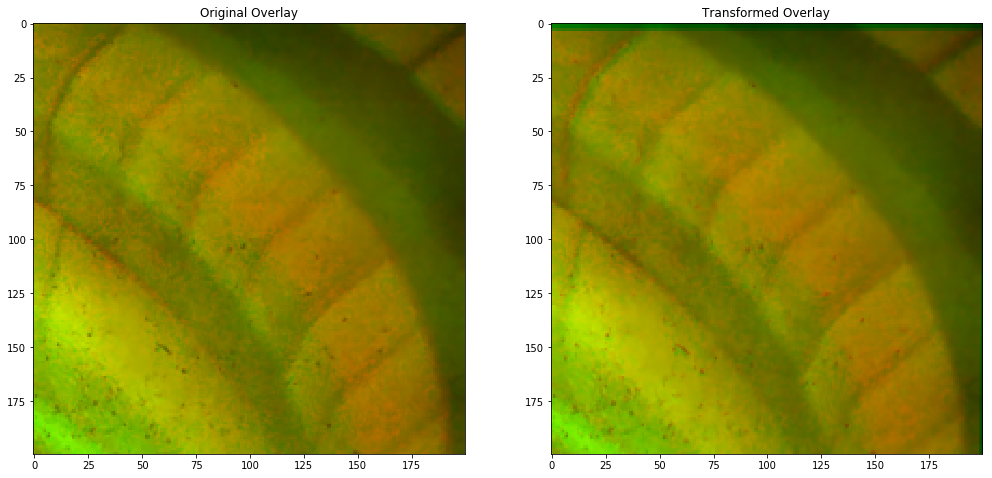

In [32]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[0:200,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[0:200,300:500])

plt.show()

These images are already basically aligned, although it looks like we may have obtained some slight improvement. At least nothing crazy happens.. Let's try one more.

### 2

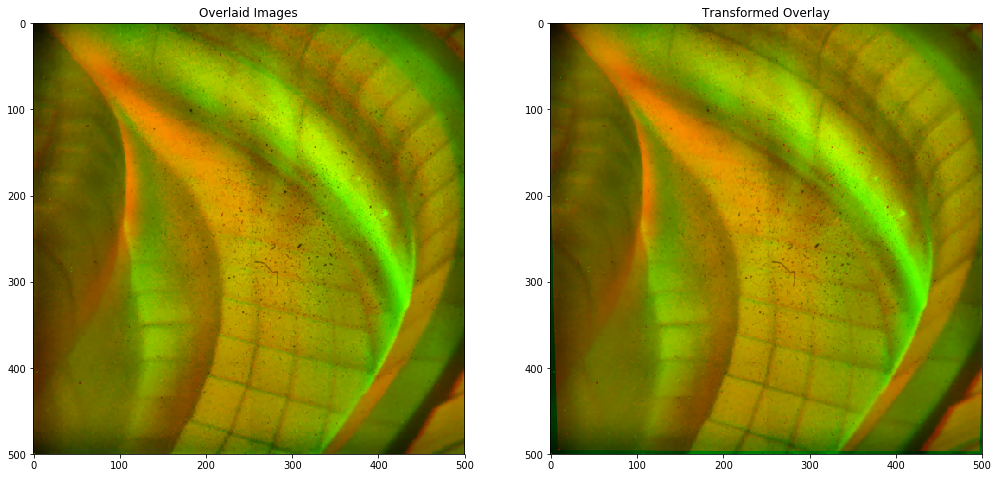

In [34]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/92189-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91995-pp.png', cv2.IMREAD_GRAYSCALE)

df = pd.read_csv('deepmatching/tests/92189-pp--91995-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.RANSAC)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

plt.show()

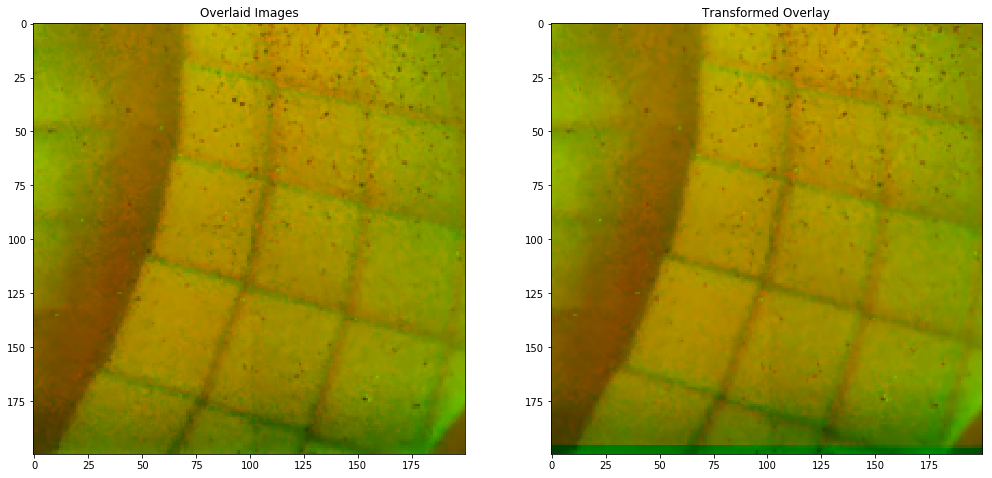

In [35]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2)[300:500, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500, 150:350])

plt.show()

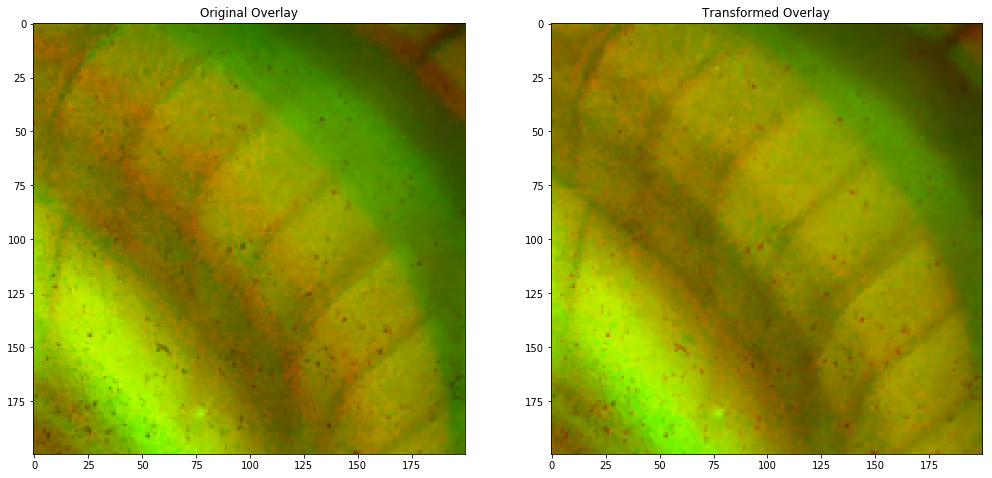

In [36]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[0:200,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[0:200,300:500])

plt.show()

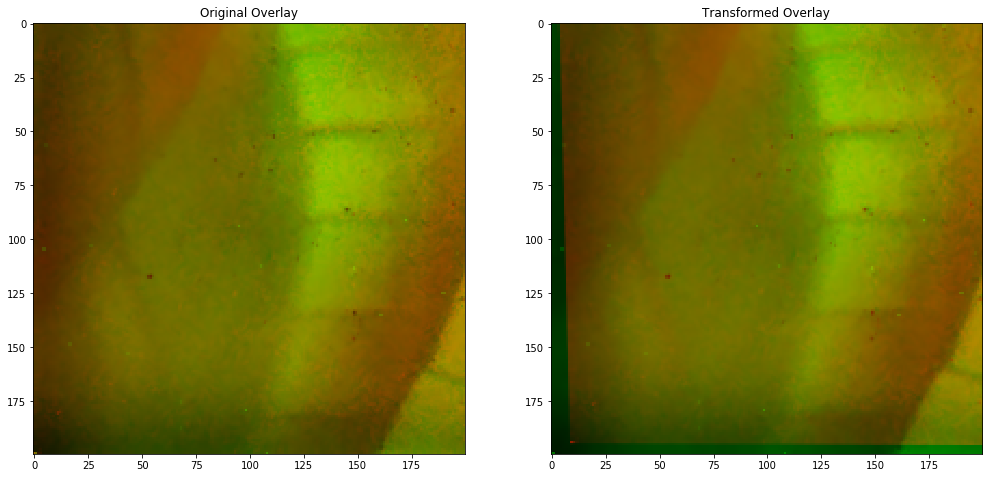

In [37]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,0:200])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,0:200])

plt.show()

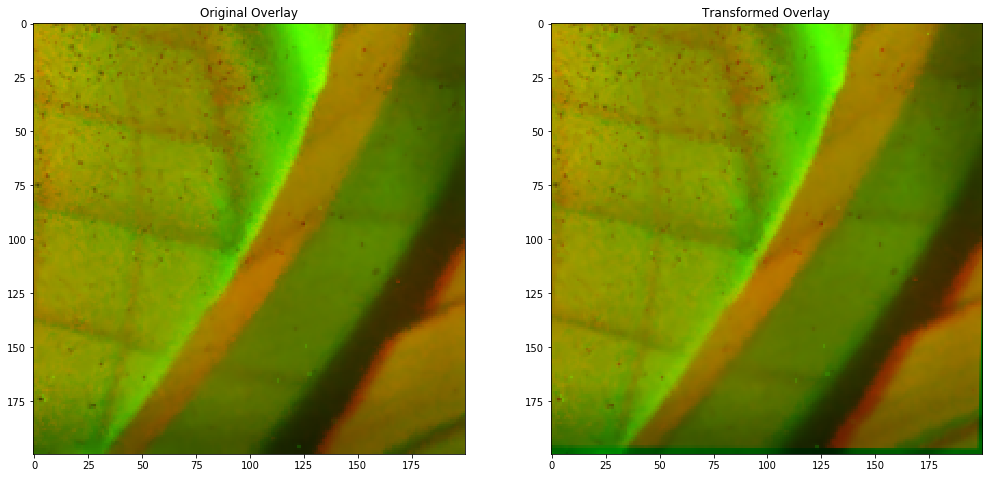

In [38]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,300:500])

plt.show()

Although the feature in the bottom right actually becomes less aligned, it is not looks like the rest of the image is quite aligned?

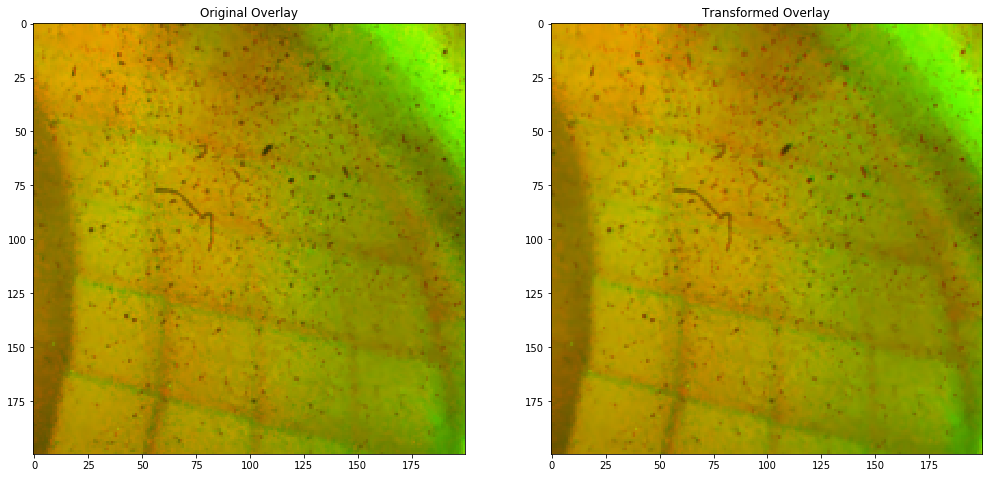

In [39]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[200:400,200:400])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[200:400,200:400])

plt.show()

### 3

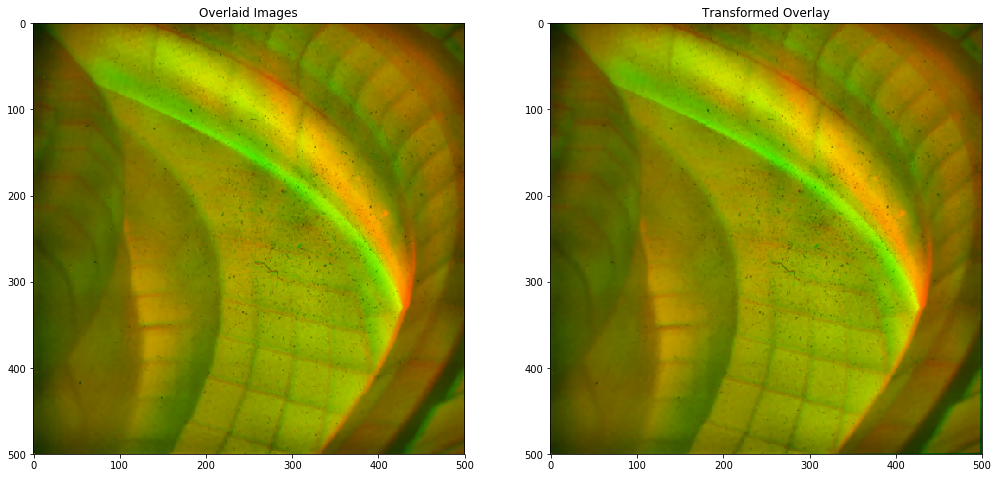

In [40]:
img_1 = cv2.imread('data/real/KL11-E1DC/manual-pp/91995-pp.png', cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread('data/real/KL11-E1DC/manual-pp/91651-pp.png', cv2.IMREAD_GRAYSCALE)

df = pd.read_csv('deepmatching/tests/91995-pp--91651-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','maximise','minimise'])

before = df[['x_1','y_1']].values
after = df[['x_2','y_2']].values

h_matrix, mask = cv2.findHomography(before, after, method=cv2.RANSAC)
base_transformed_img = cv2.warpPerspective(img_1, h_matrix, dsize=img_1.shape)

plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2))


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2))

more_agg_pp = overlay(base_transformed_img, img_2)

plt.show()

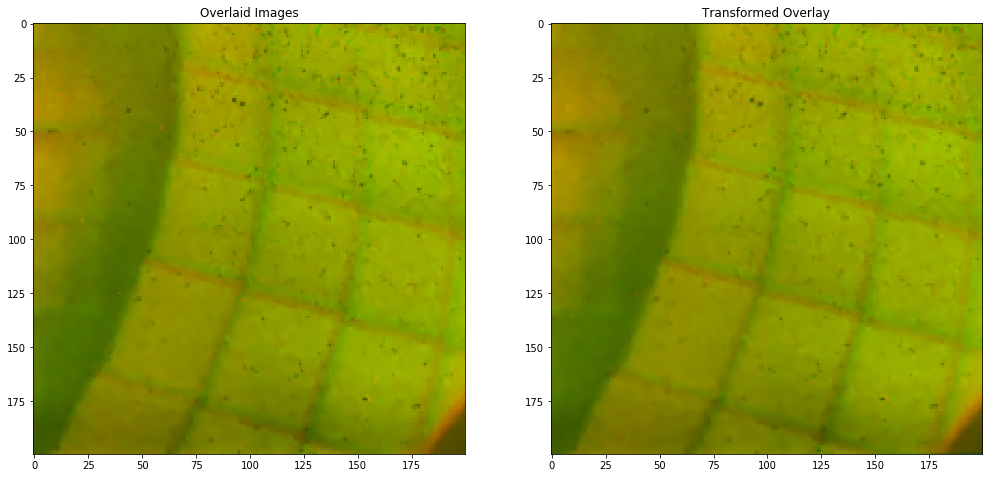

In [41]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Overlaid Images')
plt.imshow(overlay(img_1, img_2)[300:500, 150:350])


plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500, 150:350])

plt.show()

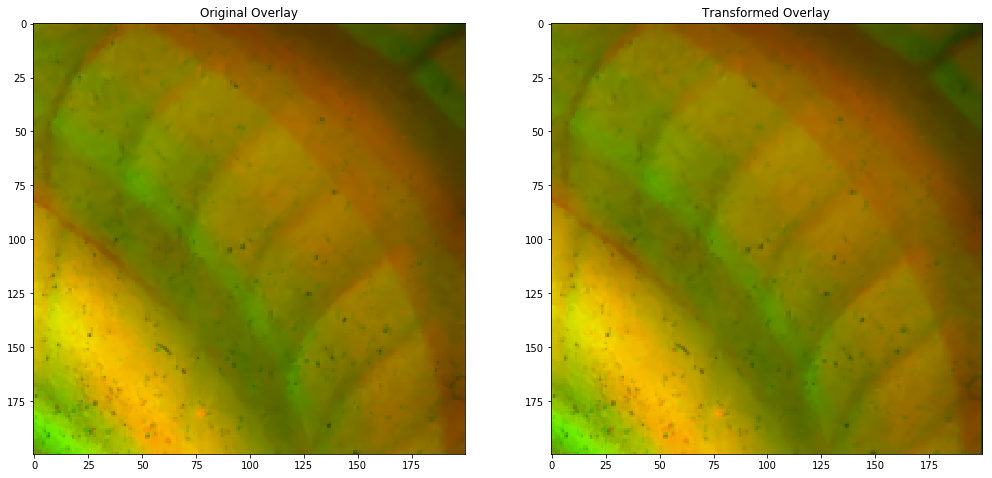

In [42]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[0:200,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[0:200,300:500])

plt.show()

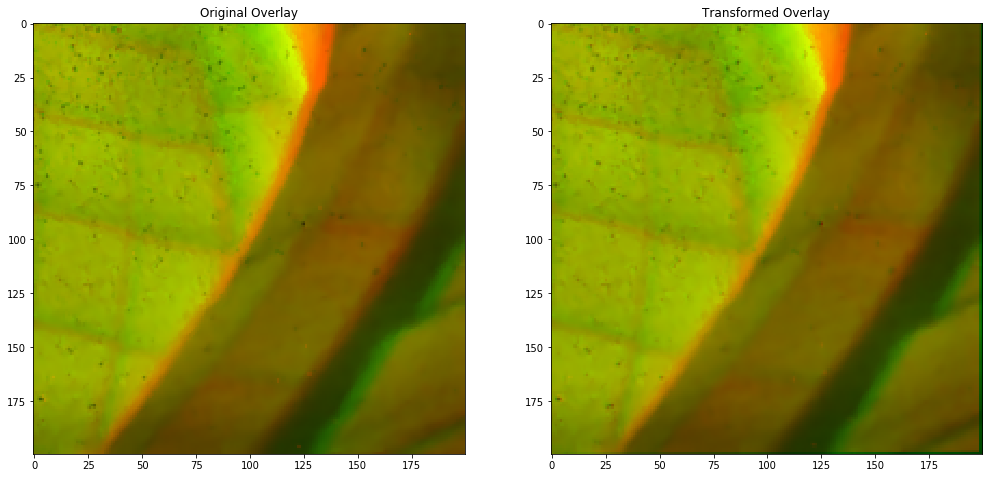

In [43]:
plt.figure(1, figsize=(17,17))

plt.subplot(121)
plt.title('Original Overlay')
plt.imshow(overlay(img_1, img_2)[300:500,300:500])

plt.subplot(122)
plt.title('Transformed Overlay')
plt.imshow(overlay(base_transformed_img, img_2)[300:500,300:500])

plt.show()

It is quite hard to judge the results (are those red fringes due to misalignment or light bleeding off those features due to their illumination?). This motivates the need for a better way of judging results (we plan to use CAD wireframes for this). Again, at least nothing terrible happens...

To sum up, DeepMatching performs remarkably well in images without plasma. The limit set of images we have with plasma are a bit harder to work out, but they are also not the best example as the real use case for images with plasma would be consecutive frames in video where there would be much more similarity between images.

# Score

We want to investigate the score metric returned by the DeepMatching algorithm to see whether it would be suitable for optimising preprocessing. Looking through the code, it is not immediately clear what the score is, there are multiple definitions of score variables, and there seems to be some hirarchy of scores (presumably point pairs are scored via the entire correllation pyramid somehow.

```
const float score = top_score * sc->res_map.pixels[(ass[l]*sc->res_map.ty + y)*sc->res_map.tx + x];
...
float child_score = _local_argmax( l, xc, yc, &lower->res_map, 1, &xb, &yb );
...
score = mul_coef * sqrt( max(0,small_eigen[p0])) / (sigma_score*sqrt(2*pi))*exp(-0.5*square(dist/sigma_score));
```

The first thing we actually want to do is create a summary metric by combining all the scores for all the point pairs. As motivated below, the number of point pairs is a strong indicator of the sucecss of the match, and so we want to use this information too. After testing a few different summary scores, we settle on something simple.

In [46]:
def score_match(df):
    return int(df['score'].sum())

def score_match_std(df):
    return int(df['score'].std() * len(df))

To try to set a baseline, let's perform a DeepMatching between two identical images, which should give us perfect scores.

Two identical images
Score: 23058


Text(0.5, 1.0, 'Identical Images Scores')

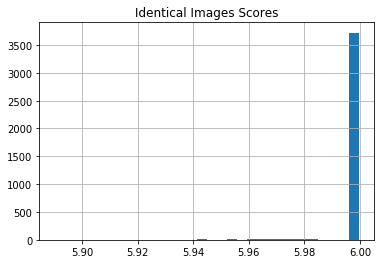

In [22]:
same_img_df = pd.read_csv('deepmatching/tests/same_img.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

print('Two identical images')
print(f'Score: {score_match(same_img_df)}')

ax = same_img_df['score'].hist(bins=30)
ax.set_title('Identical Images Scores')

Next we compare two images which have nothing in common.

Two completely different images
1026


Text(0.5, 1.0, 'Different Images Scores')

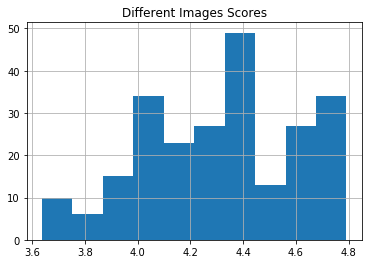

In [23]:
diff_img_df = pd.read_csv('deepmatching/tests/diff_img.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

print('Two completely different images')
print(score_match(diff_img_df))

ax = diff_img_df['score'].hist()
ax.set_title('Different Images Scores')

So not only are the scores much lower, there are also many fewer matches, and this is reflected in the summary score. Now we look at real life DeepMatching examples between two visually similar images.

In [24]:
def load_df(step, name):
    return pd.read_csv(f'MAST_Data/tests/{step}/{name}_to_{name+step}.csv', delimiter=' ', 
                                     header=None, names=['x_1','y_1','x_2','y_2','score','index'])

df_5 = [load_df(5,i) for i in range(15,100,5)]

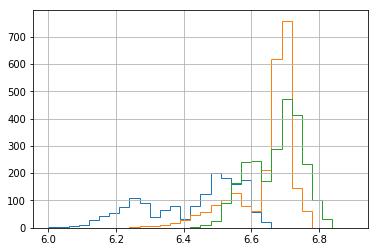

In [25]:
[df_['score'].hist(bins=30, histtype='step', range=(6,6.9)) for df_ in df_5[:3]]

Now we have score above 6, which was the value for a perfect match! Not clear what is going on.

Taking a subjective look, the image pair corresponding to the blue histogram is more different than that of the yellow, which provides us with some hope that the score is actually doing something sensible.

### With without manual pp

In [34]:
img_id = 89425

img = cv2.imread(f'data/real/KL11-E1DC/manual-pp/{img_id}.png', cv2.IMREAD_GRAYSCALE)
cv2.imwrite(f'data/real/KL11-E1DC/manual-pp/{img_id}-ds.png', cv2.pyrDown(img))

True

In [35]:
img_id = 91355

df1 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-ds.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

df2 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

print(f'Image {img_id}')
print(f'downsampled score: {score_match(df1)}')
print(f'preprocessed score: {score_match(df2)}')

Image 91355
downsampled score: 3460
preprocessed score: 6671


In [36]:
img_id = 91993

df3 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-ds.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

df4 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

print(f'Image {img_id}')
print(f'downsampled score: {score_match(df1)}')
print(f'preprocessed score: {score_match(df2)}')

Image 91993
downsampled score: 3460
preprocessed score: 6671


In [37]:
img_id = 89425

df5 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-ds.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

df6 = pd.read_csv(f'deepmatching/tests/image-pp_to_{img_id}-pp.csv', delimiter=' ', 
                 header=None, names=['x_1','y_1','x_2','y_2','score','index'])

print(f'Image {img_id}')
print(f'downsampled score: {score_match(df1)}')
print(f'preprocessed score: {score_match(df2)}')

Image 89425
downsampled score: 3460
preprocessed score: 6671


These results at least appear to consistent and encoraing.

In [51]:
before_pp_score1 = [score_match(df1), score_match(df3), score_match(df5)]
after_pp_score1 = [score_match(df2), score_match(df4), score_match(df6)]

before_pp_score1_std = [score_match_std(df1), score_match_std(df3), score_match_std(df5)]
after_pp_score1_std = [score_match_std(df2), score_match_std(df4), score_match_std(df6)]

<ErrorbarContainer object of 3 artists>

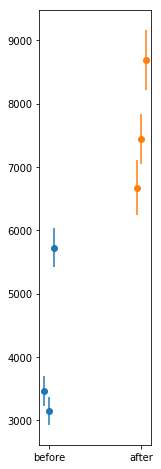

In [52]:
xs_before = [-1.1,-1,-0.9]
xs_after = [0.9,1,1.1]

plt.figure(figsize=(2,8))
ax = plt.gca()
#ax.set_yscale('log')
ax.set_xticks([-1, 1])
ax.set_xticklabels(['before', 'after'])

plt.errorbar(xs_before, before_pp_score1, yerr=before_pp_score1_std, fmt='o')
plt.errorbar(xs_after, after_pp_score1, yerr=after_pp_score1_std, fmt='o')

The score looks sensible for these matches.

The images in question are below for reference.

In [58]:
img_ids = [91355,91993,89425]
img = cv2.imread(f'data/real/KL11-E1DC/manual-pp/image-pp.png', cv2.IMREAD_GRAYSCALE)
imgs = [cv2.imread(f'data/real/KL11-E1DC/manual-pp/{img_id}.png', cv2.IMREAD_GRAYSCALE) for img_id in img_ids]
imgs_pp = [cv2.imread(f'data/real/KL11-E1DC/manual-pp/{img_id}-pp.png', cv2.IMREAD_GRAYSCALE) for img_id in img_ids]

(<matplotlib.axes._subplots.AxesSubplot at 0x1a20c5a940>,
 <matplotlib.image.AxesImage at 0x1a20cb2710>)

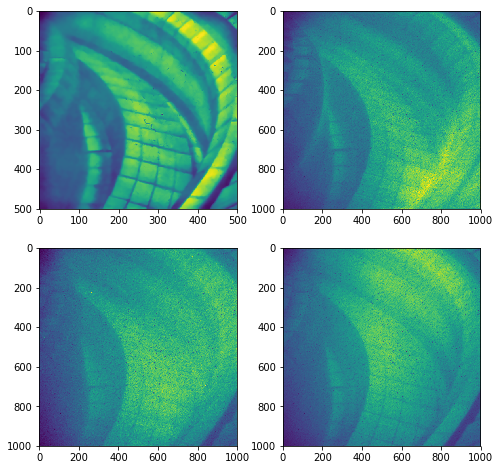

In [56]:
plt.figure(figsize=(8,8))
plt.subplot(221),plt.imshow(img)
plt.subplot(222),plt.imshow(imgs[0])
plt.subplot(223),plt.imshow(imgs[1])
plt.subplot(224),plt.imshow(imgs[2])

(<matplotlib.axes._subplots.AxesSubplot at 0x1a211ec5c0>,
 <matplotlib.image.AxesImage at 0x1a2124f390>)

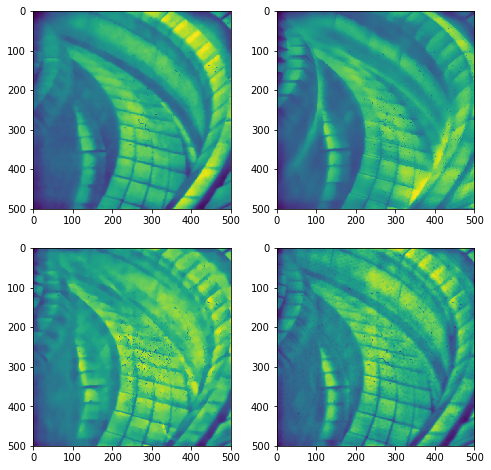

In [57]:
plt.figure(figsize=(8,8))
plt.subplot(221),plt.imshow(img)
plt.subplot(222),plt.imshow(imgs_pp[0])
plt.subplot(223),plt.imshow(imgs_pp[1])
plt.subplot(224),plt.imshow(imgs_pp[2])